In [1]:
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
from wbfm.utils.projects.finished_project_data import ProjectData
import napari
import pandas as pd
from tqdm.auto import tqdm
import numpy as np
from collections import defaultdict
import zarr
from pathlib import Path
import os
import seaborn as sns

/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


In [2]:
from sklearn.decomposition import PCA
from wbfm.utils.visualization.plot_traces import make_grid_plot_from_dataframe
import seaborn as sns
import plotly.express as px

In [64]:
fname = "/scratch/neurobiology/zimmer/fieseler/wbfm_projects/2022-11-27_spacer_7b_2per_agar/ZIM2165_Gcamp7b_worm1-2022_11_28/project_config.yaml"
# Manually corrected version
# fname = "/scratch/neurobiology/zimmer/fieseler/wbfm_projects/manually_annotated/paper_data/ZIM2165_Gcamp7b_worm1-2022_11_28/project_config.yaml"
project_data_gcamp = ProjectData.load_final_project_data_from_config(fname)

ConfigFile  : INFO     =======================================
Project data for directory:
/scratch/neurobiology/zimmer/fieseler/wbfm_projects/2022-11-27_spacer_7b_2per_agar/ZIM2165_Gcamp7b_worm1-2022_11_28 
With raw data in directory:
/scratch/neurobiology/zimmer/ulises/wbfm/20221127/data/ZIM2165_Gcamp7b_worm1/2022-11-27_15-14_ZIM2165_worm1_GC7b_Ch0-BH 

Found the following data files:
============Raw========================
red_data:                 True
green_data:               True
============Annotations================
manual_tracking:          True
============Segmentation===============
raw_segmentation:         True
colored_segmentation:     True
============Traces=====================
traces:                   True



In [58]:
fname = "/scratch/neurobiology/zimmer/Charles/dlc_stacks/immobilization_tests/2022-12-12_immob/2022-12-13_10-38_ZIM2165_immob_worm8-2022-12-13/project_config.yaml"
project_data_immob = ProjectData.load_final_project_data_from_config(fname)

FileNotFoundError: /scratch/neurobiology/zimmer/Charles/dlc_stacks/immobilization_tests/2022-12-12_immob/2022-12-13_10-38_ZIM2165_immob_worm8-2022-12-13/project_config.yaml not found!

In [6]:
output_folder = 'intro'

# Make the all-in-one summary figure, and the rotate the 3d plot to be a good angle

In [7]:
from wbfm.utils.visualization.plot_traces import make_summary_interactive_heatmap_with_pca, make_summary_interactive_heatmap_with_kymograph

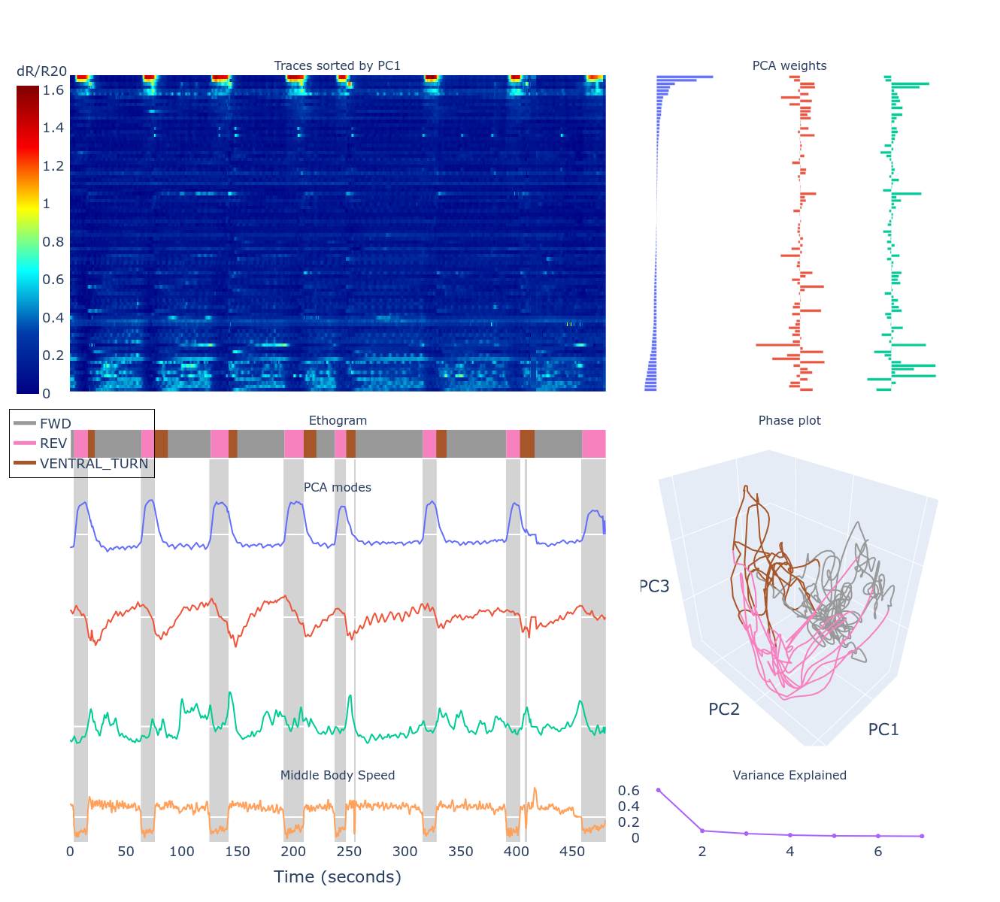

In [79]:
project_data_gcamp.use_physical_x_axis = True
fig = make_summary_interactive_heatmap_with_pca(project_data_gcamp, to_save=False, to_show=True, use_manual_annotations=True)

In [77]:
%debug

> /home/charles/Current_work/repos/dlc_for_wbfm/wbfm/utils/visualization/plot_traces.py(1427)build_all_plot_variables_for_summary_plot()
   1425             # Only show the legend if the behavior is FWD or REV
   1426             showlegend = state_code.full_name in {'FWD', 'REV', 'FWD and VENTRAL_TURN'}
-> 1427             err
   1428             phase_plot_list.append(
   1429                 go.Scatter3d(x=df_out[col_names[0][i]], y=df_out[col_names[1][i]], z=df_out[col_names[2][i]], mode='lines',



ipdb>  state_codes


array([<BehaviorCodes.FWD: 1>, <BehaviorCodes.REV: 2>,
       <BehaviorCodes.DORSAL_TURN|REV: 10>,
       <BehaviorCodes.VENTRAL_TURN|FWD: 5>,
       <BehaviorCodes.VENTRAL_TURN|REV: 6>], dtype=object)


ipdb>  state_codes[3].full_name


'VENTRAL_TURN and FWD'


ipdb>  q


In [49]:

# fig.update_layout(
#     legend=dict(
#         itemsizing='constant',  # Display legend items as colored boxes and text
#         x=-0.07,  # Adjust the x position of the legend
#         y=0.52,  # Adjust the y position of the legend
#         bgcolor='rgba(0, 0, 0, 0.05)',  # Set the background color of the legend
#         bordercolor='Black',  # Set the border color of the legend
#         borderwidth=1,  # Set the border width of the legend
#         font=dict(size=16)  # Set the font size of the legend text
#     )
# )
# fig.show()

In [ ]:
fname = os.path.join(output_folder, 'summary_wbfm.png')
fig.write_image(str(fname))
fname = Path(fname).with_suffix('.svg')
fig.write_image(str(fname))
fname = Path(fname).with_suffix('.html')
fig.write_html(str(fname))

## Immobilized

In [57]:
from wbfm.utils.general.utils_behavior_annotation import approximate_behavioral_annotation_using_pc1
beh_vec = approximate_behavioral_annotation_using_pc1(project_data_immob)

NameError: name 'project_data_immob' is not defined

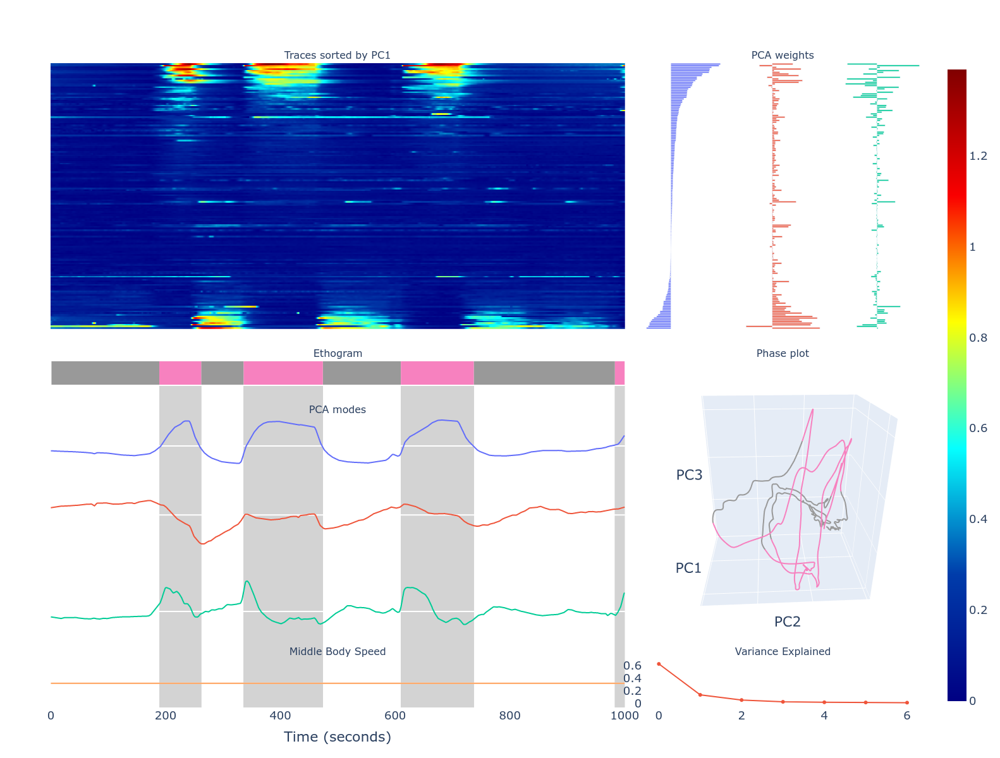

In [21]:
fig = make_summary_interactive_heatmap_with_pca(project_data_immob, to_save=False, to_show=True, trace_opt=dict(nan_using_ppca_manifold=False))

In [ ]:
fname = os.path.join(output_folder, 'summary_immob.png')
fig.write_image(str(fname))
fname = Path(fname).with_suffix('.svg')
fig.write_image(str(fnuame))


# Heatmap alone

In [10]:
from wbfm.utils.visualization.plot_traces import build_all_plot_variables_for_summary_plot

In [11]:
# column_widths, ethogram_opt, heatmap, heatmap_opt, kymograph, kymograph_opt, phase_plot_list, phase_plot_list_opt, row_heights, subplot_titles, trace_list, trace_opt_list, trace_shading_opt, var_explained_line, var_explained_line_opt, weights_list, weights_opt_list = build_all_plot_variables_for_summary_plot(
#         project_data_gcamp, 3, trace_opt={})


In [ ]:
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
df_traces = project_data_gcamp.calc_default_traces()
df_traces = df_traces - df_traces.min()
fps = 3.5
df_traces.index = df_traces.index / fps

fig = px.imshow(df_traces.T, zmin=0, zmax=1, color_continuous_scale='jet')

fig.update_layout(
    xaxis_title="Time (s)",
    coloraxis_colorbar=dict(title='dR/R20')
)

fig.show()

fname = os.path.join(output_folder, 'wbfm_just_heatmap.png')
fig.write_image(str(fname))
fname = Path(fname).with_suffix('.svg')
fig.write_image(str(fname))

### Also kymograph

In [ ]:
fig = make_summary_interactive_heatmap_with_kymograph(project_data_gcamp, to_save=False, to_show=True)

In [14]:
fname = os.path.join(output_folder, 'summary_wbfm_kymograph.png')
fig.write_image(str(fname))
fname = Path(fname).with_suffix('.svg')
fig.write_image(str(fname))
fname = Path(fname).with_suffix('.html')
fig.write_html(str(fname))


14.285714285714286

In [62]:
project_data_gcamp.worm_posture_class.beh_annotation().unique()

array([<BehaviorCodes.FWD: 1>, <BehaviorCodes.REV: 2>,
       <BehaviorCodes.DORSAL_TURN|REV: 10>,
       <BehaviorCodes.DORSAL_TURN|FWD: 9>,
       <BehaviorCodes.VENTRAL_TURN|FWD: 5>,
       <BehaviorCodes.TRACKING_FAILURE: 1024>,
       <BehaviorCodes.HEAD_CAST|VENTRAL_TURN|FWD: 133>,
       <BehaviorCodes.HEAD_CAST|FWD: 129>,
       <BehaviorCodes.HEAD_CAST|SELF_COLLISION|FWD: 193>,
       <BehaviorCodes.HEAD_CAST|SELF_COLLISION|VENTRAL_TURN|FWD: 197>,
       <BehaviorCodes.SELF_COLLISION|DORSAL_TURN|REV: 74>,
       <BehaviorCodes.VENTRAL_TURN|REV: 6>,
       <BehaviorCodes.SELF_COLLISION|VENTRAL_TURN|REV: 70>,
       <BehaviorCodes.SELF_COLLISION|VENTRAL_TURN|FWD: 69>,
       <BehaviorCodes.QUIESCENCE|VENTRAL_TURN: 36>,
       <BehaviorCodes.QUIESCENCE: 32>,
       <BehaviorCodes.SELF_COLLISION|REV: 66>,
       <BehaviorCodes.NOT_ANNOTATED: 256>], dtype=object)